In [72]:
import shap
import pandas as pd
import numpy as np
from sklearn import metrics
from preprocessing import *
import matplotlib.pyplot as plt
from sklearn.utils import resample
import seaborn as sns
from scipy.stats import norm
from sklearn.model_selection import KFold
from feature_selector import FeatureSelector
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score,average_precision_score, recall_score, roc_auc_score, roc_curve,f1_score
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import PowerTransformer
from xgboost import XGBClassifier
import scikitplot as skplt
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.manifold import TSNE
import matplotlib.patches as mpatches
import xgboost

#### <b style= "color:blue"> Some notes for readers:</b>


<ul>
    <li> The codes with <b style = "color: red">red comment</b> will alter the dataset (i.e. Power transform, normalization, PCA, ....). The end of these codes is marked with: <b style = "color: red">========</b> </li>
    <li> It is necessary to activate Javascript in your browser to see SHAP plots</li>
    <li> Because of high number of observations, running T-SNE, K-NN, distribution and SHAP plots may take several minutes</li>
</ul>

In [36]:
data = pd.read_csv("desafio_fraude.csv")
data.head()

,Ocorrencia,PP1,PP2,PP3,PP4,PP5,PP6,PP7,PP8,PP9,...,PP21,PP22,PP23,PP24,PP25,PP26,PP27,PP28,Sacado,Fraude
0,-44299.0,-1.239996,0.985194,-1.005080,0.251323,0.872854,-1.677811,1.451311,-0.478908,-0.009459,...,0.387768,0.286200,0.128686,1.280392,-0.301116,-0.673309,-0.069611,-0.009597,-28.38,0
1,-44300.0,-0.472690,1.869177,-0.277741,1.122846,1.526166,0.262325,0.242333,-0.006108,-1.659659,...,-0.387745,-0.434629,0.512801,-0.110994,-0.350975,-0.073826,0.035071,-0.080140,-407.00,0
2,-44301.0,0.277314,3.455314,-0.722444,-0.428284,2.512025,-0.540760,0.345111,-0.013655,-0.233508,...,-0.630255,-0.388096,0.697177,-0.523084,-0.069830,0.196482,0.052145,-0.166683,-800.00,0
3,-44301.0,-1.061770,-0.105481,-0.226711,-0.929524,-0.100625,-0.300173,0.029912,-0.205934,0.233190,...,-0.147422,-0.426827,0.070413,0.283090,-0.487739,0.288220,-0.035644,-0.007305,-31.28,0
4,-44302.0,4.622715,2.621667,0.872085,0.374010,1.456021,-1.531875,-0.162837,-1.331547,-0.340639,...,0.221196,0.804017,1.309062,1.505088,0.260178,-0.861611,-0.130562,1.023781,-522.16,0


In [70]:
data.shape

(150000, 31)

### Check list:

In [71]:
##################### TO DO!
##### ** Missing values --> simple or complex imputation
##### ** Imbalanced data
##### ** upsampling
##### ** Feature selection
##### ** Collinear variables
##### ** Anomaly detection: isolation forest, IQR
#### ** Random or stratified samples
#### ** Rebalance instances by class
#### ** Removing outliers
#### ** Removing highly correlated attributes
#### ** Applying dimensionality reduction methods (principle components or t-SNE)
#### ** Classification:
    #### ** Linear and non-linear classifiers
    #### ** Hyper parameter tuning
    #### ** Complex non-linear approaches: Backpropagation and Support Vector Machines
    #### ** Random forest and gradient boosted machines
#### ** Analysing the sacado and ocorrencia mean and SD for Frause = 0 and 1

## Exploratory Data Analysis (EDA)

Fisrt of all, lets take a look at the data and find its characteristics. First, we try finding out wheather there are missing values in the data set. Then, we check the general measures of each feature. Afterwards, we try to analyse the distribution of each variable in order to measure the type of distribution, its skewness and kurtosis. In case of having dramatically skewed or sharp distribution (kurtosis > 3), we may use transformations like Power or Log Transform and soften the probability distribution so that helping the model make good decisions. It is also important to analyse these characters in terms of target class in order to understand the distribution of each feature which results in distinct classes. Another important task is to find out wheather the target classes are imbalanced.

In [58]:
data.isnull().values.any()

False

In [5]:
data.describe()

,Ocorrencia,PP1,PP2,PP3,PP4,PP5,PP6,PP7,PP8,PP9,...,PP21,PP22,PP23,PP24,PP25,PP26,PP27,PP28,Sacado,Fraude
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,...,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,-84550.214580,0.058999,-0.000790,-0.192183,-0.037416,0.061588,-0.025715,0.026695,-0.004257,0.028148,...,0.009957,0.027398,0.007275,-0.002739,-0.035211,-0.001127,-0.000535,-0.001028,-88.602261,0.001580
std,27710.748503,1.894453,1.623712,1.406053,1.397615,1.341265,1.310820,1.194923,1.205874,1.106154,...,0.739429,0.707714,0.622620,0.606964,0.506130,0.483787,0.397662,0.307684,247.302373,0.039718
min,-133236.000000,-2.454930,-22.057729,-9.382558,-16.875344,-32.911462,-21.307738,-31.527244,-16.635979,-15.594995,...,-27.202839,-10.503090,-19.002942,-4.022866,-7.519589,-3.220178,-12.152401,-22.620072,-19656.530000,0.000000
25%,-115169.000000,-1.243456,-0.802149,-1.138473,-0.812624,-0.526469,-0.424574,-0.527260,-0.340863,-0.565387,...,-0.165038,-0.466423,-0.128298,-0.431560,-0.369398,-0.247606,-0.090965,-0.078861,-77.662500,0.000000
50%,-77502.500000,0.042647,-0.082193,-0.359076,-0.039549,0.124219,0.245177,-0.013129,-0.037083,0.095975,...,0.033794,0.014600,0.020008,-0.049357,-0.071030,0.057265,-0.004792,-0.016759,-22.040000,0.000000
75%,-61713.750000,0.952018,0.588600,0.555060,0.816575,0.751890,0.734024,0.564334,0.193112,0.678488,...,0.225362,0.540801,0.164620,0.348762,0.274183,0.331361,0.068544,0.048427,-5.410000,0.000000
max,-44299.000000,36.802320,63.344698,33.680984,5.683171,31.356750,21.929312,43.557242,73.216718,13.434066,...,34.830382,10.933144,44.807735,2.824849,10.295397,2.604551,22.565679,11.710896,-0.000000,1.000000


In [16]:
data.skew()
data.kurtosis()

Ocorrencia     -1.233584
PP1            25.986264
PP2            89.265004
PP3            20.400983
PP4             2.352666
PP5            36.594900
PP6             9.457224
PP7           109.039155
PP8           285.265301
PP9             3.986454
PP10           39.241041
PP11            0.507095
PP12           18.289324
PP13            0.193402
PP14           18.826998
PP15            0.175506
PP16            8.346095
PP17           78.350687
PP18            2.043436
PP19            1.560077
PP20          221.257496
PP21          238.779321
PP22            3.755903
PP23          437.565830
PP24            0.643787
PP25            5.115491
PP26            0.680991
PP27          144.103168
PP28          491.959237
Sacado        672.159398
Fraude        627.933946
dtype: float64

As it is illustrated in the below figure, the distribution of features' values related to "not a fraude" (blue points) for the majority of features is leptokurtic. As seen, the data is not highly skewed. To make the data distribution more Gaussian like and reduce the sharpness, we may use Box-cox transformation also known as power transformation. Normal distribution is favorable because it is simple to analyse and to understand. Moreover it has important properties which makes working with this distribution easier.

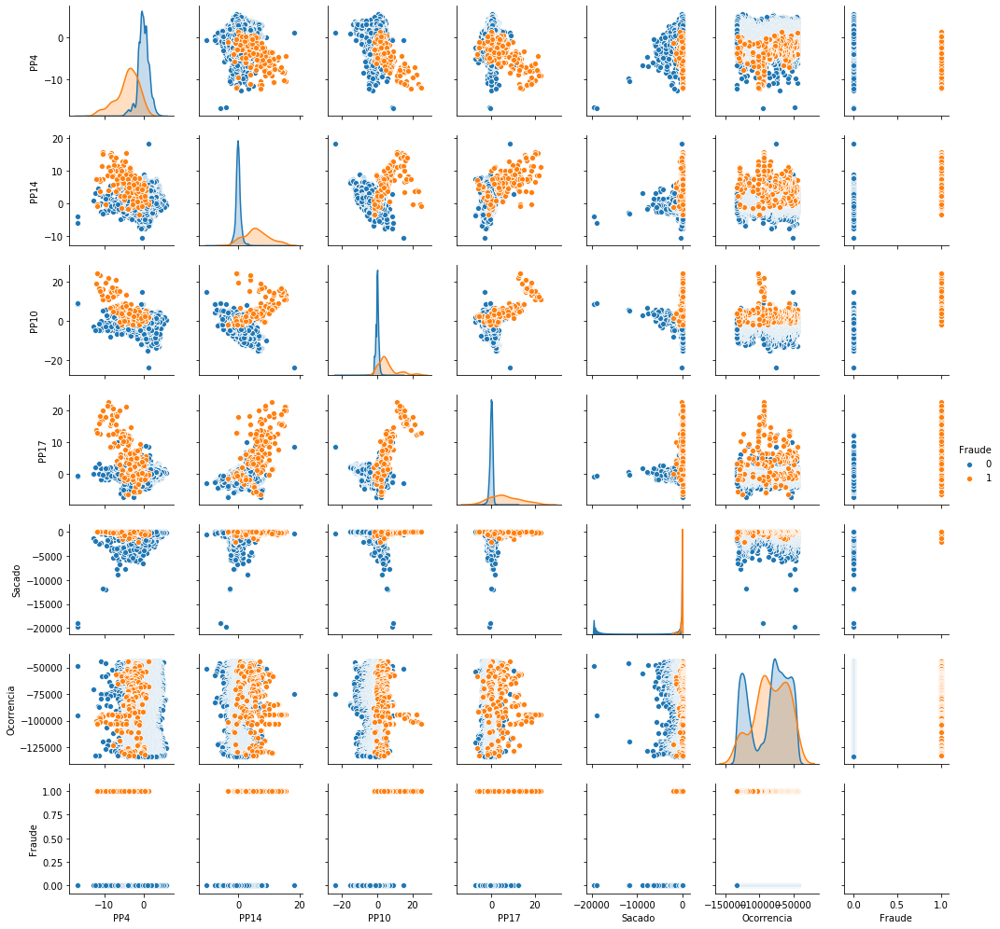

In [12]:
sns.pairplot(data[["PP4", "PP14", "PP10", "PP17", "Sacado", "Ocorrencia", "Fraude"]], size=2, hue="Fraude")

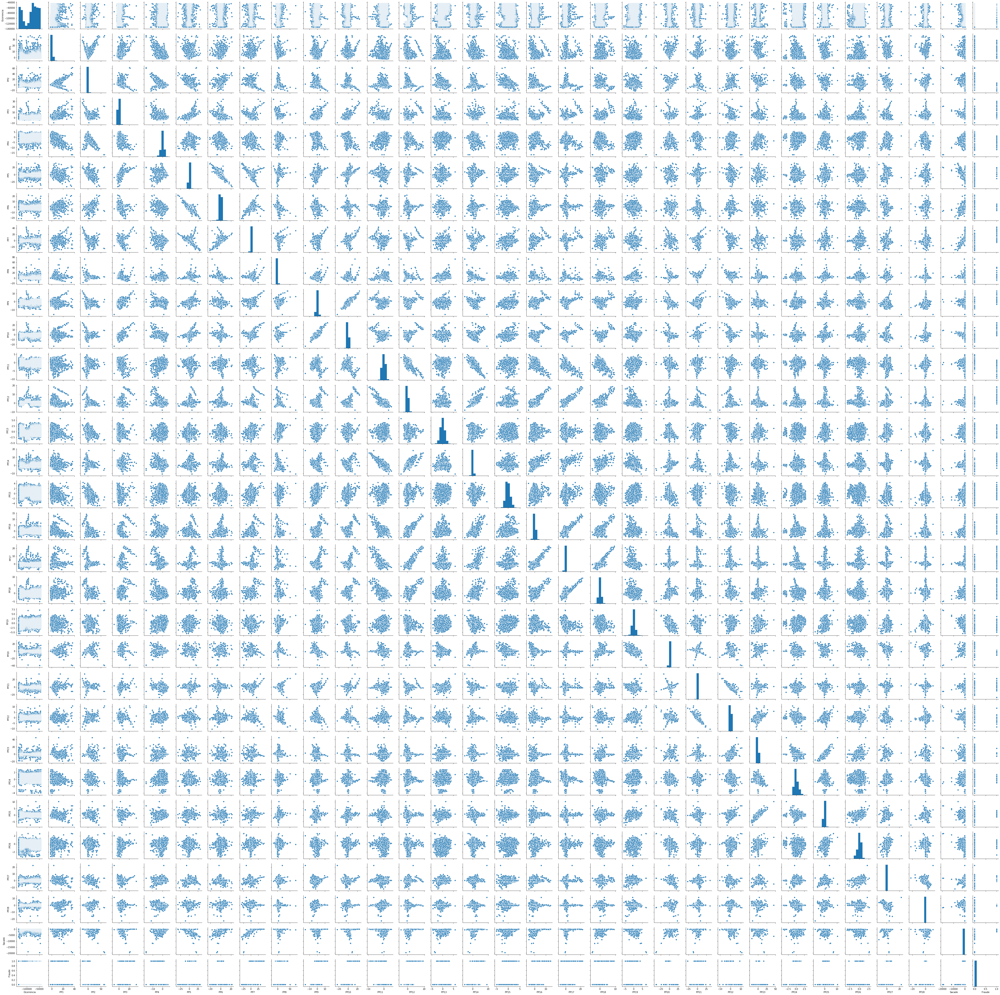

In [31]:
sns.pairplot(data, height=2)

### <b>The classes are highly unbalanced</b>
There are three ways to deal with this problem.
<ul>
    <li>
        Using different metrics like precision and recall in order to measure the performance of the classifier
    </li>
    <li>
        Using stratified K-fold in order to sampling the data considering the original proportion of the minority to majority class
    </li>
    <li>
        Using resampling with replacement to create balanced classes
    </li>
</ul>

### <b>The problem of accuracy when classes are imbalanced</b>

When we use accuracy, we attribute the same cost to false positives and false negatives. When the dataset is imbalanced (say it has 99% instances in one class and only 1% in the other) the problem begins when the actual costs we assign to each error are not the same. If we deal with credit default which is relatively a rare event, the cost of not predicting the risk of a fraud is extremely high when it happens. 

As seen below, the data related to Fraude are only 0.0015% of the entire data, showing that the dataset is extremely imbalanced. Here I prefer using resampling in order to have a balanced data. To do so, I will over sample the minority class using an improved version of SMOTE called ADASYN.

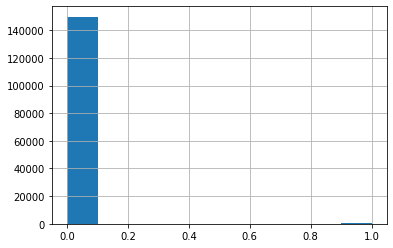

In [36]:
y = data["Fraude"]
y.hist()

In [30]:
y.describe()

count        31.000000
mean      -4297.879117
std       23929.902505
min     -133236.000000
25%          -0.708258
50%           0.000000
75%           0.690316
max           2.593376
Name: 149999, dtype: float64

In [27]:
### The proportion of fraude to not fraude!
len(y[y==1])/len(y[y==0])

0.9984174996494461

### Sacado and Ocorrencia features analysis
As shown in the below description, the Sacado feature for those clients who default has a higher negative number than those with no default. On the other hand, the mean of Ocorrencia for when there is a fraud is higher than those of no fraud. 

In [15]:
#data[data["Fraude"] == 1]["Sacado"].describe()
data[data["Fraude"] == 1]["Sacado"].describe()

count     237.000000
mean     -135.321224
std       268.872638
min     -2125.870000
25%      -144.620000
50%       -18.000000
75%        -1.000000
max        -0.000000
Name: Sacado, dtype: float64

####  <b style="color:red"> ------------------- !!!  Run the below section if you want to perform a power transform ------------------ </b>

### Power transform in order to make data distribution more Gaussian-like

In [37]:
X = data.iloc[:,:-1]
y = data.iloc[:, -1]
pt = PowerTransformer()
pt.fit(X)
X = pd.DataFrame(pt.transform(X))
X.columns = data.columns[:-1]

In [76]:
data.columns

Index(['Ocorrencia', 'PP1', 'PP2', 'PP3', 'PP4', 'PP5', 'PP6', 'PP7', 'PP8',
       'PP9', 'PP10', 'PP11', 'PP12', 'PP13', 'PP14', 'PP15', 'PP16', 'PP17',
       'PP18', 'PP19', 'PP20', 'PP21', 'PP22', 'PP23', 'PP24', 'PP25', 'PP26',
       'PP27', 'PP28', 'Sacado', 'Fraude', 'anomaly'],
      dtype='object')

invalid value encountered in true_divide
invalid value encountered in double_scalars


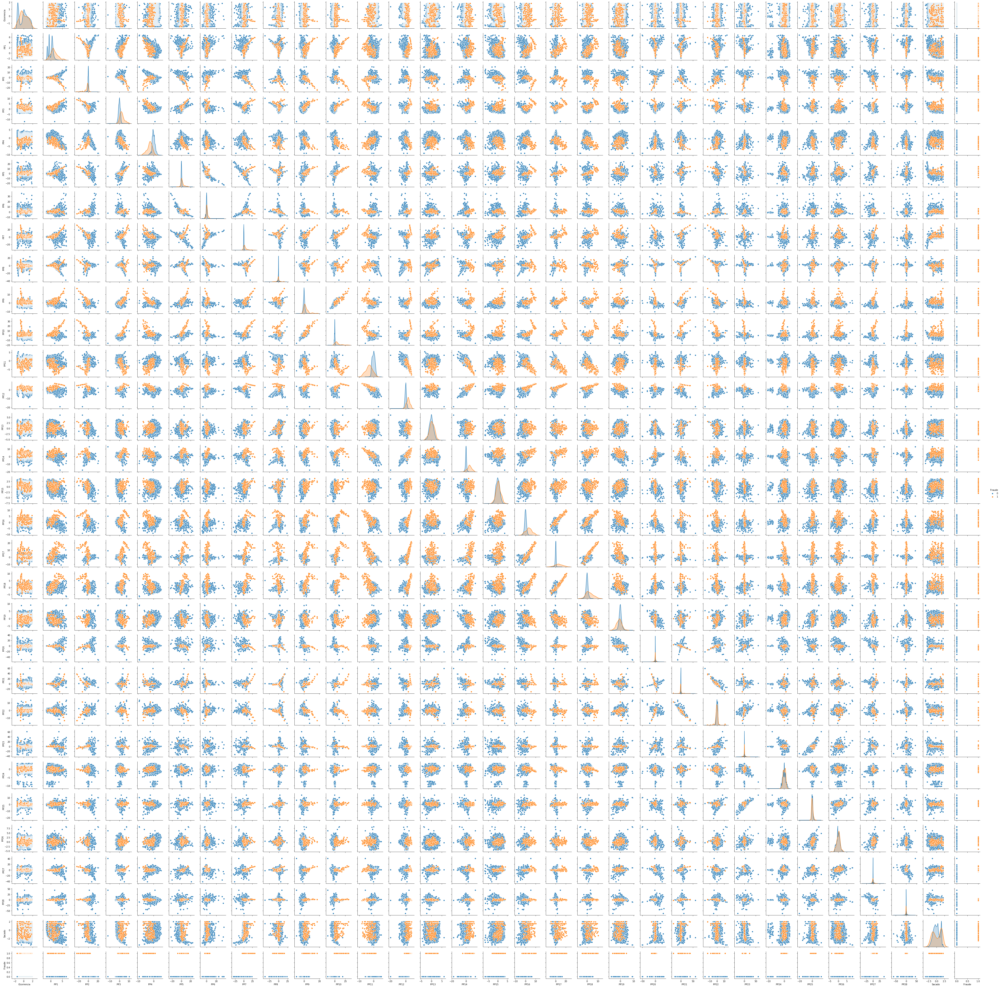

In [59]:
## The below plot shsows the distribution of data after transforming data using power transform=========================
##### Click on the image to zoom! For detailed explanation, please read the PDF file sent with this code!
##### Distribution of data after applying Box-cox
X["Fraude"] = y
sns.pairplot(X, size=2, hue = "Fraude")

<b style= "color:red"> =============================== </b>

### Colinarity

As the below results show, there is no collinarity between the features.

In [20]:
fs = FeatureSelector(data = X, labels= y)
fs.identify_collinear(correlation_threshold = -1)
collinear_features = fs.ops['collinear']
fs.record_collinear.head()

29 features with a correlation magnitude greater than -1.00.



,drop_feature,corr_feature,corr_value
0,PP1,Ocorrencia,0.192508
1,PP2,Ocorrencia,-0.013216
2,PP2,PP1,-0.244376
3,PP3,Ocorrencia,-0.385189
4,PP3,PP1,-0.313882


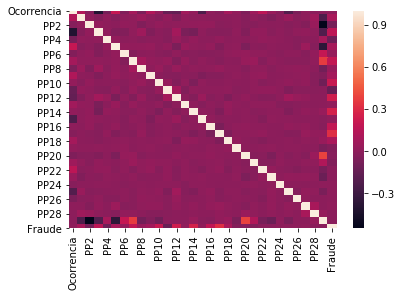

In [24]:
corr = data.corr()
sns.heatmap(corr)

<b style="color:red"> !!! ===> Run the below code if you want to mark the anomalies with 1 and -1. Running this section will result in having a new feature in the dataset called "Anomaly" </b>

### Anomaly detection
Most parametric statistics, like means, standard deviations, and correlations, and every algorithm based on these, are highly sensitive to outliers. Despite all this it is not acceptable to drop an observation just because it is an outlier. Being an outlier can simply mean being different. Outliers can be legitimate observations and are sometimes the most interesting ones. One way to deal with outliers in classification task is to remove them and then to measure the classification performance. If the performance is dropped, this means that although the outliers are different than the rest of the data, but they help the model in making good decisions. There are several ways to detect outlier. Here, I used IQR and Isolation Forest.

#### Isolation Forest

In [32]:
clf = IsolationForest(n_estimators = 100, max_samples='auto', contamination=float(.12), \
 bootstrap=False, n_jobs=-1, random_state=42, verbose=0)
clf.fit(data)
pred = clf.predict(data)
len(pred[pred == -1])
data['anomaly'] = pred
data[data['anomaly'] == 1].head()
data.shape

18000

#### IQR

In [29]:
Q1 = X.quantile(0.25)
Q3 = X.quantile(0.75)
IQR = Q3 - Q1
indexes = X[~((X < (Q1 - 1.5 * IQR)) |(X > (Q3 + 1.5 * IQR))).any(axis=1)].index

In [30]:
len(indexes)

85505

In [44]:
len(data)

150000

In [28]:
y = y.iloc[indexes]
X.shape[0] == len(y)

True

In [73]:
y = data["Fraude"]
X = data.drop(["Fraude"], axis = 1)
X.head()

,Ocorrencia,PP1,PP2,PP3,PP4,PP5,PP6,PP7,PP8,PP9,...,PP21,PP22,PP23,PP24,PP25,PP26,PP27,PP28,Sacado,anomaly
0,-44299.0,-1.239996,0.985194,-1.005080,0.251323,0.872854,-1.677811,1.451311,-0.478908,-0.009459,...,0.387768,0.286200,0.128686,1.280392,-0.301116,-0.673309,-0.069611,-0.009597,-28.38,1
1,-44300.0,-0.472690,1.869177,-0.277741,1.122846,1.526166,0.262325,0.242333,-0.006108,-1.659659,...,-0.387745,-0.434629,0.512801,-0.110994,-0.350975,-0.073826,0.035071,-0.080140,-407.00,1
2,-44301.0,0.277314,3.455314,-0.722444,-0.428284,2.512025,-0.540760,0.345111,-0.013655,-0.233508,...,-0.630255,-0.388096,0.697177,-0.523084,-0.069830,0.196482,0.052145,-0.166683,-800.00,-1
3,-44301.0,-1.061770,-0.105481,-0.226711,-0.929524,-0.100625,-0.300173,0.029912,-0.205934,0.233190,...,-0.147422,-0.426827,0.070413,0.283090,-0.487739,0.288220,-0.035644,-0.007305,-31.28,1
4,-44302.0,4.622715,2.621667,0.872085,0.374010,1.456021,-1.531875,-0.162837,-1.331547,-0.340639,...,0.221196,0.804017,1.309062,1.505088,0.260178,-0.861611,-0.130562,1.023781,-522.16,-1


In [58]:
X.shape[0] == len(y)

True

##### <b style= "color:red"> =============================== </b>

### Feature importance

In [52]:
fs.identify_zero_importance(task = 'classification', 
                            eval_metric = 'auc', 
                            n_iterations = 100, 
                             early_stopping = True)

Training Gradient Boosting Model

Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[3]	valid_0's auc: 0.940486	valid_0's binary_logloss: 0.00404906
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1]	valid_0's auc: 0.940995	valid_0's binary_logloss: 0.00429684
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1]	valid_0's auc: 0.926045	valid_0's binary_logloss: 0.00462561
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[3]	valid_0's auc: 0.918902	valid_0's binary_logloss: 0.0109588
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1]	valid_0's auc: 0.860787	valid_0's binary_logloss: 0.00702047
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1]	valid_0's auc: 0.873893	valid_0's binary_logloss: 0.0070

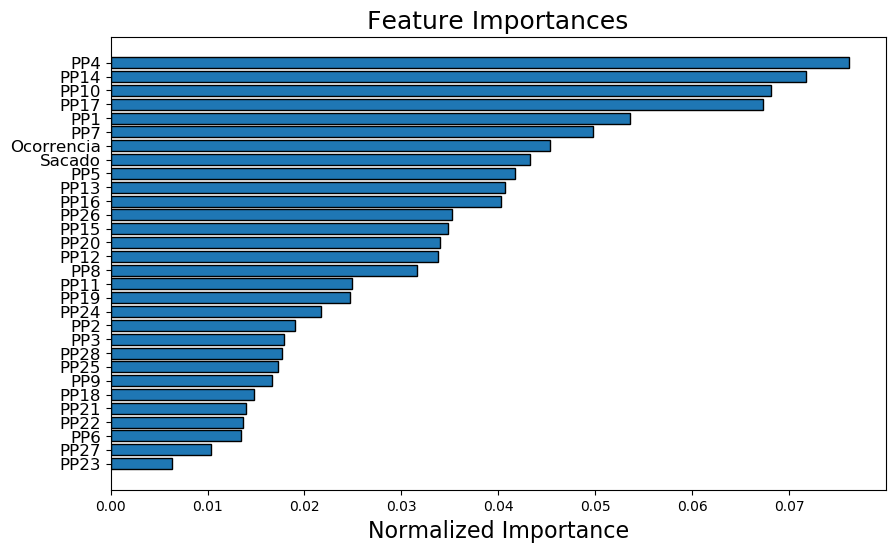

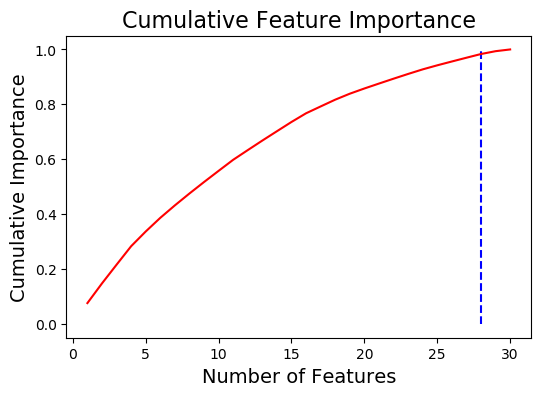

28 features required for 0.98 of cumulative importance


In [67]:
fs.plot_feature_importances(threshold = 0.98, plot_n = 30)

In [129]:
rf = RandomForestClassifier()
rf.fit(X, y)
skplt.estimators.plot_feature_importances(
rf, feature_names = X.columns, figsize=(15, 5))

### Model explanation

In [62]:
############# This code should be run again so that you can see the plot!
shap.initjs()
model = xgboost.train({"learning_rate": 0.01}, xgboost.DMatrix(X, label=y), 100)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version
Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [96]:
np.mean(y)

0.00158

In [63]:
shap.force_plot(explainer.expected_value, shap_values[300:800], X.iloc[300:800,:])

In [15]:
shap_values[0:1000]

array([[ 0.14553615,  0.03243409, -0.49327654, ..., -0.17557515,
        -0.47070357, -0.41404027],
       [ 0.49456036,  0.04821394, -0.42835626, ..., -0.12740554,
        -0.33685496, -0.49676317],
       [-1.0080273 ,  0.2723584 , -0.3635229 , ...,  0.11294851,
         0.01374413, -0.9057537 ],
       ...,
       [ 0.2755715 ,  0.22910474, -0.40311593, ...,  0.11799549,
        -0.38349554, -0.72332615],
       [ 0.17737055,  0.14252128, -0.07058047, ..., -0.03591149,
        -0.00275801, -0.35181051],
       [-0.41005984,  0.24382803,  0.645492  , ..., -0.26461825,
        -0.2820075 , -0.2796537 ]], dtype=float32)

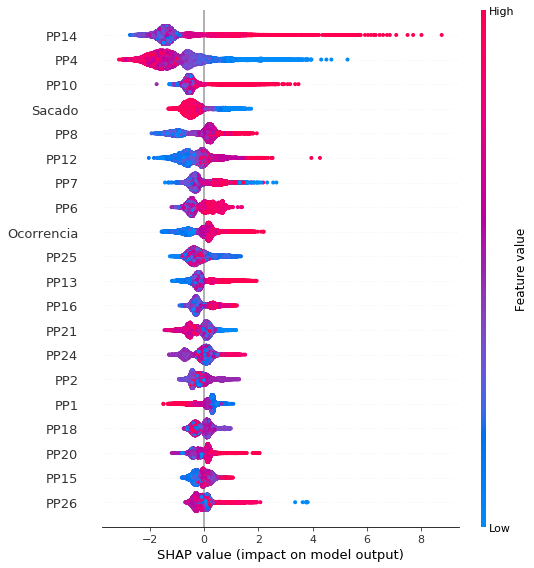

In [33]:
shap.summary_plot(shap_values, X_test)

In [60]:
shap_values.shape

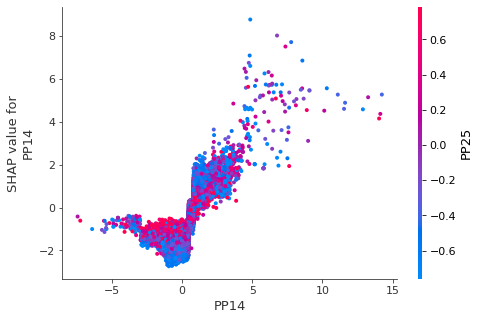

In [38]:
shap.dependence_plot("PP14", shap_values, X_test)

<b style= "color:red"> !!! =================== Run the below code if you want to apply PCA ======== </b>

### Elbow method to get the the optimal number of components in PCA

In [119]:
### Normalizing the data
X = X.apply(lambda x: (x - np.mean(x)) / (np.max(x) - np.min(x)))
pca = PCA()
pca_fit = pca.fit(X)
p1 = pca_fit.components_[1]
#eigenvalues
pca_fit.explained_variance_
#percentage of variance explained
pca_fit.explained_variance_ratio_

array([4.60433531e-01, 1.69308668e-01, 6.50176048e-02, 4.66502330e-02,
       4.18047241e-02, 3.11684752e-02, 2.77003493e-02, 2.61861296e-02,
       2.47386871e-02, 2.07043497e-02, 1.80538012e-02, 1.39850082e-02,
       8.71291179e-03, 7.19372465e-03, 6.22447923e-03, 5.41279531e-03,
       5.25139647e-03, 4.22362643e-03, 3.61624216e-03, 2.61446057e-03,
       2.11234404e-03, 2.07053307e-03, 1.36416758e-03, 1.34002034e-03,
       1.07923769e-03, 7.68422497e-04, 6.83511171e-04, 6.11975246e-04,
       5.34886737e-04, 4.33703290e-04])

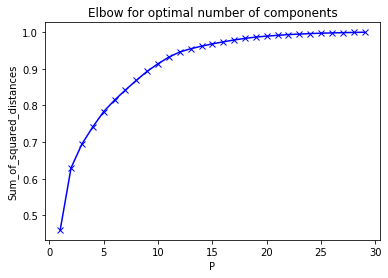

In [120]:
K = range(1,X.shape[1])
explained = []
sum_var = 0
for k in K:
    sum_var += pca_fit.explained_variance_ratio_[k-1]
    explained.append(sum_var)
plt.plot(K, explained, 'bx-')
plt.xlabel('P')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow for optimal number of components')
plt.show()

In [121]:
sum(pca_fit.explained_variance_ratio_[0:21])

0.9911135423726518

In [122]:
## Dimensionality reduction using PCA
X = data.iloc[:,:-1]
y = data.iloc[:, -1]
pca_transformed_X = pca_fit.transform(X)
X = pd.DataFrame(pca_transformed_X[:,0:21])

<b style= "color:red"> =============================== </b>

### T-SNE (data visualization)

In [59]:
ada = ADASYN(sampling_strategy='minority', random_state=42, n_jobs=-1)
X_sm, y_sm = ada.fit_resample(X.values, y.values)
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(X_sm)

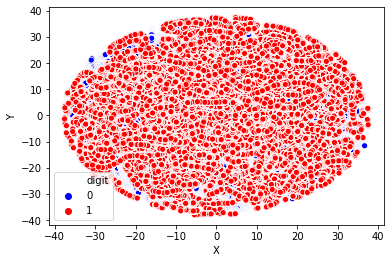

In [61]:
tsne_df = pd.DataFrame({'X':X_reduced_tsne[:,0],
                        'Y':X_reduced_tsne[:,1],
                        'digit':y_sm})
sns.scatterplot(x="X", y="Y",
              hue="digit",
              palette=['blue','red'],
              legend='full',
              data = tsne_df);

In [57]:
tsne_df.head()

,X,Y,digit
0,16.062824,42.633163,0
1,2.954750,35.489792,0
2,-7.975192,19.654373,0
3,16.028517,42.607090,0
4,2.912580,35.447414,0


## Classification

model: K-NN
Accuracy : 0.9250888888888888 
recall: 0.5194805194805194 
model: Gradient Boosting
Accuracy : 0.9991111111111111 
recall: 0.8181818181818182 
model: Decision tree
Accuracy : 0.9978888888888889 
recall: 0.8311688311688312 
model: Naive Bayes
Accuracy : 0.9835777777777778 
recall: 0.8571428571428571 


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


model: Logistic Regression
Accuracy : 0.9775333333333334 
recall: 0.8961038961038961 


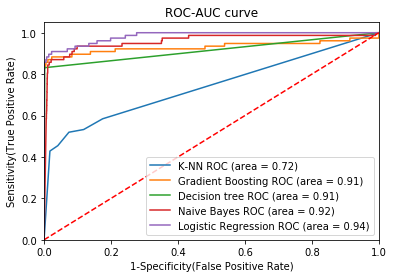

In [69]:
modelList = [
{
    'label': 'K-NN',
    'model': KNeighborsClassifier(n_neighbors = 5)
},
{
    'label': 'Gradient Boosting',
    'model': GradientBoostingClassifier(n_estimators = 200, learning_rate=0.7, max_depth=8, random_state=42)
},

{
    'label': 'Decision tree',
    'model': DecisionTreeClassifier(random_state=0)     
},
    
{
    'label': 'Naive Bayes',
    'model': GaussianNB()     
},

{
    'label': 'Logistic Regression',
    'model':  LogisticRegression(random_state=0)
}]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

ada = ADASYN(sampling_strategy='minority', random_state=42, n_jobs=-1)
X_sm, y_sm = ada.fit_resample(X_train.values, y_train.values)

for mdl in modelList:
    model = mdl['model']
    model.fit(X_sm, y_sm)
    y_pred = model.predict(X_test.values)
    fpr, tpr, thresholds = metrics.roc_curve(y_test.values, model.predict_proba(X_test.values)[:,1])
    auc = metrics.roc_auc_score(y_test, model.predict(X_test.values))
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (mdl['label'], auc))
    print("model: %s" % mdl['label'])
    print("Accuracy : %s " %  accuracy_score(y_test.values, y_pred))
    print("recall: %s " % recall_score(y_test.values, y_pred))
    print("======================")

plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1-Specificity(False Positive Rate)')
plt.ylabel('Sensitivity(True Positive Rate)')
plt.title('ROC-AUC curve')
plt.legend(loc="lower right")
plt.show()

### Hyper paremeter tuning for the chosen method:

In [130]:
logistic = LogisticRegression(max_iter=10)
penalty = ['l1', 'l2']
C = np.logspace(0, 6, 10)
hyperparameters = dict(C=C, penalty=penalty)
clf = GridSearchCV(logistic, hyperparameters, cv=5, verbose=0)
best_model = clf.fit(X, y)
print('Best C:', best_model.best_estimator_.get_params()['C'])
print('Best penalty:', best_model.best_estimator_.get_params()['penalty'])